# MTH3302 : Méthodes probabilistes et statistiques pour l'I.A.

Jonathan Jalbert<br/>
Professeur adjoint au Département de mathématiques et de génie industriel<br/>
Polytechnique Montréal<br/>


Le projet a été préparé par Gabriel Gobeil, associé de recherche à Polytechnique Montréal.

---
# Projet A2022 : Récolte des cerfs de Virginie


La description du projet est disponible à l'adresse suivante : https://www.kaggle.com/t/23b6d8c44f1247c78e19a6a902f804af

Ce calepin Jupyter de base permet de charger et de nettoyer les données fournies. La dernière section détaille la génération du fichier des prédictions afin de le soumettre sur Kaggle dans le bon format.

## Données

Les données disponibles pour le sujet sont les suivantes :
- recolte.csv
- permis.csv
- meteo.csv
- essence.csv
- test.csv

In [1]:
using CSV, DataFrames, Statistics, Dates, Gadfly, ColorSchemes, Impute, StatsBase, MLJ, LinearAlgebra

# on retire l'ambiguité de la fonction transform
transform = DataFrames.transform

transform (generic function with 4 methods)

---
## 1. Chargement de données

#### Récolte annuelle de cerfs par zones de chasse selon les différents engins

In [2]:
recolte = CSV.read("data/recolte.csv", DataFrame)
first(recolte, 5)

,Année,Zone,Engin,Cerfs
,Int64,Int64,String15,Int64
1,1999,2,Arc,58
2,1999,2,Carabine,852
3,1999,2,Indéterminé,12
4,1999,3,Arc,94
5,1999,3,Carabine,1422


#### Nombre de permis de chasse alloués annuellement aux résidents et non-résidents

In [3]:
permis = CSV.read("data/permis.csv", DataFrame)
first(permis, 5)

,Année,Résidents,Résidents premier abbatage,Non-résidents,Total
,Int64,Int64,Int64?,Int64,Int64
1,1998,135409,missing,1230,136639
2,1999,131325,missing,1260,132585
3,2000,137346,missing,1463,138809
4,2001,144074,missing,1551,145625
5,2002,151154,missing,1735,152889


#### Moyenne mensuelle du prix de détail de l'essence en cents pour Québec et Montréal

In [4]:
essence = CSV.read("data/essence.csv", DataFrame)
first(essence, 5)

,Mois,Québec,Montréal
,Date,Float64,Float64
1,1997-04-01,60.1,60.3
2,1997-05-01,60.7,60.5
3,1997-06-01,59.4,61.5
4,1997-07-01,57.9,59.7
5,1997-08-01,62.8,64.0


#### Données météorologiques quotidiennes à Montréal-Trudeau entre 1999 et 2021

In [5]:
meteo = CSV.read("data/meteo.csv", DataFrame)
first(meteo, 5)

,Date/Time,Mean Temp (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm)
,Date,Float64?,Float64?,Float64?,Int64?
1,1999-01-01,-20.5,0.0,1.0,2
2,1999-01-02,-19.2,0.0,0.0,2
3,1999-01-03,-8.5,1.2,11.4,7
4,1999-01-04,-9.4,0.0,0.0,8
5,1999-01-05,-14.3,0.0,0.0,8


---
## 2. Analyse exploratoire

Nous commençons tout d'abord par une analyse exploratoire des données que nous pourrons comparer en parallèle avec de la documentation existante sur le sujet.

### 2.1 Contenu des dataframes

#### Récolte

In [6]:
describe(recolte)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,Année,2010.2,1999,2010.0,2020,0,Int64
2,Zone,9.40041,1,8.0,28,0,Int64
3,Engin,,ACB,,Indéterminé,0,String15
4,Cerfs,492.294,0,50.0,7943,0,Int64


In [7]:
unique(recolte.Engin)

6-element Vector{String15}:
 "Arc"
 "Carabine"
 "Indéterminé"
 "ACB"
 "Arbalète"
 "Fusil"

Nous remarquons que les collectes sont séparées en `Année`, `Zone` et `Engin`.

#### Permis

In [8]:
describe(permis)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Int64,Float64,Int64,Int64,Type
1,Année,2009.0,1998,2009.0,2020,0,Int64
2,Résidents,1.46421e5,126315,143829.0,171684,0,Int64
3,Résidents premier abbatage,9081.92,8369,8951.0,9816,11,"Union{Missing, Int64}"
4,Non-résidents,1266.65,691,1230.0,1830,0,Int64
5,Total,1.52426e5,132585,152889.0,173330,0,Int64


Nous remarquons des valeurs manquantes pour la colonne `Résidents premier abbatage`

#### Météo

In [9]:
describe(meteo)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,Type
1,Date/Time,,1999-01-01,2009-12-31,2021-12-31,0,Date
2,Mean Temp (°C),7.47565,-26.5,8.1,30.1,18,"Union{Missing, Float64}"
3,Total Rain (mm),2.29677,0.0,0.0,73.8,26,"Union{Missing, Float64}"
4,Total Snow (cm),0.573052,0.0,0.0,45.6,13,"Union{Missing, Float64}"
5,Snow on Grnd (cm),4.12935,0,0.0,51,2006,"Union{Missing, Int64}"


Nous remarquons des valeurs manquantes pour les colonnes `Mean Temp (°C)`, `Total Rain (mm)`, `Total Snow (cm)` et `Snow on Grnd (cm)`

#### Essence


In [10]:
describe(essence)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,DataType
1,Mois,,1997-04-01,2009-12-01,2022-08-01,0,Date
2,Québec,103.841,51.8,105.7,219.7,0,Float64
3,Montréal,105.648,52.2,107.4,216.5,0,Float64


#### Remarques

Nous pouvons noter que nous avons principalement des variables de type quantitatives. Seulement les `Engins` et `Zone` sont de type qualitatives nominales.

### 2.3 Géographie

Afin de mieux comparer le comportement dans différentes zones, il est primordial de prendre connaissance de la géographie des zones.

<img src="https://cdn-contenu.quebec.ca/cdn-contenu/chasse/Images/ZonesChasse.jpg" alt="Carte de chasse quebec" width="400"/>

Nous pouvons noter que :
* La superficie des zones varie beaucoup
* La zone `20` est un ile isolée
* La zone `21` correspond au fleuve et golfe Saint-Laurent

### 2.2 Quantité de cerfs récoltés annuellement dans toutes les zones pour tous les engins de chasse

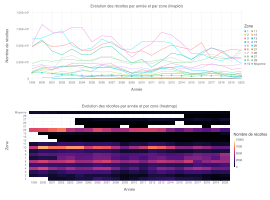

In [11]:
set_default_plot_size(27cm, 20cm)

df = combine(groupby(recolte, [:Zone, :Année]), :Cerfs => sum => :Cerfs)
moyenne_df = combine(groupby(recolte, :Année), :Cerfs => mean => :Cerfs)
moyenne_df.Zone .= "Moyenne"

lineplot = plot(df, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Cerfs,
    color=:Zone, Scale.color_discrete, 
    Geom.line,
    Guide.ylabel("Nombre de récoltes"), Guide.title("Evolution des récoltes par année et par zone (lineplot)"),
    layer(moyenne_df, x=:Année, y=:Cerfs, Geom.line, Geom.point, color=["Moyenne"]),
)

heatmap = plot(df, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Zone, Scale.y_discrete,
    color=:Cerfs, Guide.colorkey(title="Nombre de récoltes"), Scale.ContinuousColorScale(palette -> get(ColorSchemes.magma, palette)),
    Geom.rectbin,
    Guide.title("Evolution des récoltes par année et par zone (heatmap)"),
    layer(moyenne_df, x=:Année, y=:Zone, Geom.rectbin, color=:Cerfs),
)

vstack(lineplot, heatmap)

Ici nous pouvons remarquer plusieurs choses :
* L'ordre de grandeur du nombre de récoles par zone n'est pas le même. Ceci peut s'expliquer par la superficie des zones de chasse dans chaque zone qui est différente et par la différence population humaine de ces zones (nous ne savons par contre pas où vivent majoritairement les cerfs au Québec donc nous ne ferons pas d'hypothèses dessus).
* Certaines zones ont des données manquantes pour certaines année (par exemple pour les zones `28`, `27`, `26`, `21`, `15`, `13`,  `12`, `1`)


Maintenant, pour essayer de comparer la tendance de chaque zone entre elles, nous faisons la différence d'une année avec celle précédente puis nous normalisons sur une échelle min-max pour chaque zone.

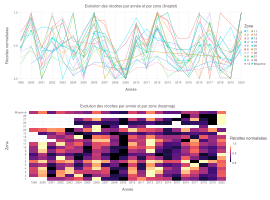

In [12]:
set_default_plot_size(27cm, 20cm)

df = combine(groupby(recolte, [:Zone, :Année]), :Cerfs => sum => :Cerfs)
df.Diff .= convert(Array{Float64,1}, df.Cerfs)

for zone in unique(df.Zone)
    for année in 1999:2020
        valeur1 = df[(df.Zone .== zone) .& (df.Année .== année-1), :Cerfs]
        valeur2 = df[(df.Zone .== zone) .& (df.Année .== année), :Cerfs]
        if length(valeur1) == 1 & length(valeur2) == 1
            df[(df.Zone .== zone) .& (df.Année .== année), :Diff] .= (valeur2-valeur1)
        else 
            df[(df.Zone .== zone) .& (df.Année .== année), :Diff] .= 0
        end
    end
    mini = minimum(df[df.Zone .== zone, :Diff])
    maxi = maximum(df[df.Zone .== zone, :Diff])
    df[df.Zone .== zone, :Diff] .= (df[df.Zone .== zone, :Diff] .- mini) ./ (maxi .- mini)
end

moyenne_df = combine(groupby(df, :Année), :Diff => mean => :Diff)
moyenne_df.Zone .= "Moyenne"

lineplot = plot(df, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Diff,
    color=:Zone, Scale.color_discrete, 
    Geom.line,
    Guide.ylabel("Récoltes normalisées"), Guide.title("Evolution des récoltes par année et par zone (lineplot)"),
    layer(moyenne_df, x=:Année, y=:Diff, Geom.line, Geom.point, color=["Moyenne"]),
)

heatmap = plot(df, 
    x=:Année, Guide.xticks(ticks=[1999:2020;]),
    y=:Zone, Scale.y_discrete,
    color=:Diff, Guide.colorkey(title="Récoltes normalisées"), Scale.ContinuousColorScale(palette -> get(ColorSchemes.magma, palette)),
    Geom.rectbin,
    Guide.title("Evolution des récoltes par année et par zone (heatmap)"),
    layer(moyenne_df, x=:Année, y=:Zone, Geom.rectbin, color=:Diff),
)

vstack(lineplot, heatmap)

Ici nous pouvons remarquer plusieurs points :
* la tendance de certaines zones semble similaire
* il y a des pics où la récolte était moindre comparé à l'année précédente (`2001`, `2005`, `2009`, `2019`). Par exemple pour l'année `2019`, ce pic de récolte moindre est accentué par une augmentation significative en `2020`.
* Les zones `20` ainsi que `6` ont une tendance de récoltes qui se distingue des autres zones pour le passage de l'année `2019` à l'année `2020`

### 2.3 Analyse de la météo

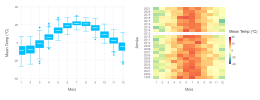

In [13]:
set_default_plot_size(26cm, 10cm)
df = copy(meteo)
df.Année .= DataFrames.transform(df, "Date/Time" => x->year.(x))[!,"Date/Time_function"]
df.Mois  .= transform(df, "Date/Time" => x->month.(x))[!,"Date/Time_function"]
df.Date  .= transform(df, "Date/Time" => x->Date.(2000,month.(x),day.(x)))[!,"Date/Time_function"]

rows = []

# la ligne suivante permet d'afficher pour chaque colonne, neanmoins cela est trop gourmant
# a l'affichage pour le navigateur. Nous affichons alors uniquement pour la température
# for col in names(select(df, Not(["Date/Time", "Année", "Mois", "Date"])))
for col in ["Mean Temp (°C)"]
    df = filter(col .=> c -> !ismissing(c) , df)
    lineplot = plot(df, x=:Mois, Guide.xticks(ticks=[1:12;]), y=col, Geom.boxplot)
    heatmap  = plot(df, 
        x=:Mois, Guide.xticks(ticks=[1:12;]),
        y=:Année, Guide.yticks(ticks=[1999:2021;]), 
        color=col,
        Scale.ContinuousColorScale(palette -> get(ColorSchemes.Spectral, 1-palette), 
            minvalue=min(df[!,col]...),
            maxvalue=max(df[!,col]...)),
        Geom.rectbin)
    push!(rows, hstack(lineplot, heatmap))
end
vstack(rows...)

Nous remarquons :
* une tendance de la météo, en particulier de la température similaire au fil des années
* une absence de données de météo pour l'année 2013
* une abscence d'information sur la neige au sol de mai à octobre pour les années `2015` jusque `2021`.

### 2.5 Analyse de l'essence

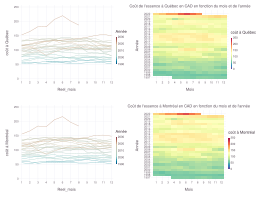

In [14]:
set_default_plot_size(26cm, 20cm)
df = copy(essence)
df.Année .= DataFrames.transform(df, "Mois" => x->year.(x))[!,"Mois_function"]
df.Reel_mois  .= transform(df, "Mois" => x->month.(x))[!,"Mois_function"]
df.Date  .= transform(df, "Mois" => x->Date.(2000,month.(x),day.(x)))[!,"Mois_function"]
rename!(df,:Québec => :"coût à Québec");
rename!(df,:Montréal => :"coût à Montréal");

rows = []
for col in names(select(df, Not(["Mois", "Année", "Reel_mois", "Date"])))
    df = filter(col .=> c -> !ismissing(c) , df)
    if col=="coût à Québec"
        city = "Québec"
    else
        city = "Montréal"
    end
    lineplot = plot(df, x=:Reel_mois, Guide.xticks(ticks=[1:12;]), y=col, color=:Année, Geom.line)
    heatmap  = plot(df, 
        x=:Reel_mois, Guide.xticks(ticks=[1:12;]),
        y=:Année, Guide.yticks(ticks=[1997:2022;]), 
        color=col,
        Scale.ContinuousColorScale(palette -> get(ColorSchemes.Spectral, 1-palette), 
            minvalue=min(df[!,col]...),
            maxvalue=max(df[!,col]...)),
        Guide.xlabel("Mois"),
        Guide.title("Coût de l'essence à "*city*" en CAD en fonction du mois et de l'année"),
        Geom.rectbin)
    push!(rows, hstack(lineplot, heatmap))
end
vstack(rows...)

Nous remarquons une augmentation regulière du prix de l'essence d'année en année.
L'année `2022` se distingue amplement mais cette dernière n'est pas à prendre en compte pour la prédiction désirée qui est sur l'année 2021.

### 2.5 Nombre de permis vendus par année

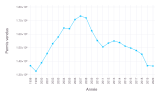

In [15]:
set_default_plot_size(16cm, 10cm)
plot(permis, x=:Année, y=:Total, Geom.line, Geom.point,
    Guide.xticks(ticks=unique(permis.Année)),
    Guide.ylabel("Permis vendus"))

### 2.6 Mise en relation du nombre de permis vendus avec le nombre de cerfs récoltés

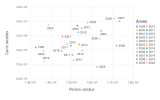

In [16]:
set_default_plot_size(16cm, 10cm)
df = innerjoin(combine(groupby(recolte, [:Année]), :Cerfs => sum => :Cerfs), permis, on = :Année)
plot(df, 
    x=:Total,
    y=:Cerfs,
    label=["$(i)" for i in unique(df.Année)],
    Geom.label,
    Geom.point,
    color=:Année, Scale.color_discrete, 
    Guide.xlabel("Permis vendus"),
    Guide.ylabel("Cerfs récoltés")
)

## 3. Complétion des données manquantes, nettoyage des données et création du dataframe

### 3.1 Résumé du prix de l'essence par la moyenne par année

In [17]:
first(essence, 1)

,Mois,Québec,Montréal
,Date,Float64,Float64
1,1997-04-01,60.1,60.3


Nous calculons la moyenne du prix de l'essence sur toute l'année.

In [18]:
essence_par_année = combine(groupby(transform(Impute.interp(essence) |> Impute.locf() |> Impute.nocb(), :Mois => x->year.(x)), :Mois_function), [:Québec => mean => :Moyenne_Québec_essence, :Montréal => mean => :Moyenne_Montréal_essence])
rename!(essence_par_année, :Mois_function => :Année)

colnames = ["Année"]
for mois in 1:12
    for col in names(select(essence, Not(:Mois)))
        for value in ["Moyenne", "Min", "Max", "Somme"] #
            push!(colnames, "$(value)_m$(mois)_$(col)")
        end
    end
end

essence_decoupee_par_mois = DataFrame(ones(length(unique(essence_par_année.Année)), length(colnames)), colnames)
essence_decoupee_par_mois.Année = unique(essence_par_année.Année)
for année in unique(essence_par_année.Année)
    
    essence_de_l_année = essence[transform(essence, "Mois" => x->year.(x))[!,"Mois_function"] .== année, :]
    for mois in 1:12
        essence_du_mois = essence_de_l_année[transform(essence_de_l_année, "Mois" => x->month.(x))[!,"Mois_function"] .== mois, :]
        info_du_mois = DataFrame()
        valeurs = Float64[]
        for c in names(select(essence_du_mois, Not(:Mois)))
            essence_decoupee_par_mois[essence_decoupee_par_mois.Année .== année, "Moyenne_m$(mois)_$(c)"] .= mean(essence_du_mois[!,c])
            if length(essence_du_mois[!,c]) > 0
                essence_decoupee_par_mois[essence_decoupee_par_mois.Année .== année, "Min_m$(mois)_$(c)"]  .= min(essence_du_mois[!,c]...)
                essence_decoupee_par_mois[essence_decoupee_par_mois.Année .== année, "Max_m$(mois)_$(c)"]  .= max(essence_du_mois[!,c]...)
            end
            essence_decoupee_par_mois[essence_decoupee_par_mois.Année .== année, "Somme_m$(mois)_$(c)"]  .= sum(essence_du_mois[!,c])
        end
    end
end

essence_par_année = innerjoin(essence_par_année, essence_decoupee_par_mois, on=:Année)
for col in names(essence_par_année)
   essence_par_année[!,col] .= replace(essence_par_année[!,col], NaN=>missing) 
end
essence_par_année = Impute.interp(essence_par_année) |> Impute.locf() |> Impute.nocb();
first(essence_par_année, 1)

,Année,Moyenne_Québec_essence,Moyenne_Montréal_essence,Moyenne_m1_Québec,Min_m1_Québec
,Int64,Float64,Float64,Float64?,Float64
1,1997,60.5778,61.6222,57.2,1.0


### 3.2 Résumé des données météorologiques par année
* Température moyenne
* Cumul de la pluie tombée
* Cumul de la neige tombée
* Moyenne du tapis neigeux

In [19]:
first(meteo, 1)

,Date/Time,Mean Temp (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm)
,Date,Float64?,Float64?,Float64?,Int64?
1,1999-01-01,-20.5,0.0,1.0,2


On impute les données manquantes par interpolation si possible, sinon nous remplacons par la valeur précédente la plus proche, sinon par la valeur suivante la plus proche.

In [20]:
meteo_cp = copy(meteo)
meteo_cp[!, "Snow on Grnd (cm)"] .= convert(Array{Union{Missing, Float64},1}, meteo_cp[!, "Snow on Grnd (cm)"])

# ici, on duplique l'année 2014 et on considere l'année 2013 identique à l'année 2014
meteo_2014 = copy(meteo_cp[transform(meteo_cp, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== 2014, :])
meteo_2014[!, "Date/Time"] .= transform(meteo_2014, "Date/Time" => x->Date.(year.(x).+1, month.(x), day.(x)))[!,"Date/Time_function"]

meteo_cp = vcat(meteo_cp, meteo_2014)
meteo_cp = Impute.interp(meteo_cp) |> Impute.locf() |> Impute.nocb()

for col in names(select(meteo_cp, Not("Date/Time")))
    meteo_cp[!, col] .= convert(Array{Union{Missing, Float64},1}, meteo_cp[!, col])
end
describe(meteo_cp)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,DataType
1,Date/Time,,1999-01-01,2010-07-02,2021-12-31,0,Date
2,Mean Temp (°C),7.46409,-26.5,8.1,30.1,0,Float64
3,Total Rain (mm),2.30037,0.0,0.0,73.8,0,Float64
4,Total Snow (cm),0.57017,0.0,0.0,45.6,0,Float64
5,Snow on Grnd (cm),3.19218,0.0,0.0,51.0,0,Float64


Nous calculons la moyenne de la température par année, le cumul de pluie tombée, le cumul de neige tombée ainsi que la moyenne de neige au sol.

In [21]:
meteo_par_année = combine(groupby(transform(meteo_cp, "Date/Time" => x->year.(x)), "Date/Time_function"), 
    ["Mean Temp (°C)" => mean => :Moyenne_température,
     "Total Snow (cm)" => sum => :Cumul_neige,
     "Total Rain (mm)" => sum => :Cumul_pluie,
     "Snow on Grnd (cm)" => mean => :Moyenne_neige_au_sol,
     ]
)
rename!(meteo_par_année,"Date/Time_function" => :Année)

colnames = ["Année"]

for mois in 1:12
    for col in names(select(meteo_cp, Not("Date/Time")))
        for value in ["Moyenne", "Min", "Max", "Somme"]
            push!(colnames, "$(value)_$(col)_m$(mois)")
        end
    end
end

meteo_decoupee_par_mois = DataFrame(ones(length(unique(meteo_par_année.Année)), length(colnames)), colnames)
meteo_decoupee_par_mois.Année = unique(meteo_par_année.Année)
for année in unique(meteo_par_année.Année)
    meteo_de_l_année = meteo_cp[transform(meteo_cp, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année, :]
    for mois in 1:12
        metéo_du_mois = meteo_de_l_année[transform(meteo_de_l_année, "Date/Time" => x->month.(x))[!,"Date/Time_function"] .== mois, :]
        info_du_mois = DataFrame()
        valeurs = Float64[]
        for c in names(select(metéo_du_mois, Not("Date/Time")))
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"Moyenne_$(c)_m$(mois)"] .= mean(metéo_du_mois[!,c])
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"Min_$(c)_m$(mois)"]  .= min(metéo_du_mois[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"Max_$(c)_m$(mois)"]  .= max(metéo_du_mois[!,c]...)
            meteo_decoupee_par_mois[meteo_decoupee_par_mois.Année .== année,"Somme_$(c)_m$(mois)"]  .= sum(metéo_du_mois[!,c])
        end
    end
end




colnames = ["Année"]

for semaine in 1:52
    for col in names(select(meteo_cp, Not("Date/Time")))
        for value in ["Moyenne", "Min", "Max", "Somme"]
            push!(colnames, "$(value)_$(col)_s$(semaine)")
        end
    end
end

meteo_decoupee_par_semaine = DataFrame(ones(length(unique(meteo_par_année.Année)), length(colnames)), colnames)
meteo_decoupee_par_semaine.Année = unique(meteo_par_année.Année)
for année in unique(meteo_par_année.Année)
    meteo_de_l_année = meteo_cp[transform(meteo_cp, "Date/Time" => x->year.(x))[!,"Date/Time_function"] .== année, :]
    for semaine in 1:52
        metéo_de_la_semaine = meteo_de_l_année[transform(meteo_de_l_année, "Date/Time" => x->week.(x))[!,"Date/Time_function"] .== semaine, :]
        info_de_la_semaine = DataFrame()
        valeurs = Float64[]
        for c in names(select(metéo_de_la_semaine, Not("Date/Time")))
            meteo_decoupee_par_semaine[meteo_decoupee_par_semaine.Année .== année,"Moyenne_$(c)_s$(semaine)"] .= mean(metéo_de_la_semaine[!,c])
            meteo_decoupee_par_semaine[meteo_decoupee_par_semaine.Année .== année,"Min_$(c)_s$(semaine)"]  .= min(metéo_de_la_semaine[!,c]...)
            meteo_decoupee_par_semaine[meteo_decoupee_par_semaine.Année .== année,"Max_$(c)_s$(semaine)"]  .= max(metéo_de_la_semaine[!,c]...)
            meteo_decoupee_par_semaine[meteo_decoupee_par_semaine.Année .== année,"Somme_$(c)_s$(semaine)"]  .= sum(metéo_de_la_semaine[!,c])
        end
    end
end

meteo_par_année = innerjoin(meteo_par_année, meteo_decoupee_par_mois, meteo_decoupee_par_semaine, on=:Année)
first(meteo_par_année, 1)

,Année,Moyenne_température,Cumul_neige,Cumul_pluie,Moyenne_neige_au_sol,Moyenne_Mean Temp (°C)_m1
,Int64,Float64,Float64,Float64,Float64,Float64
1,1999,8.26562,171.7,769.1,2.08219,-9.22258


### 3.3 Complétion des données manquantes pour permis et récolte

On impute les données manquantes par interpolation si possible, sinon nous remplacons par la valeur précédente la plus proche, sinon par la valeur suivante la plus proche.

In [22]:
unique(recolte.Engin)

6-element Vector{String15}:
 "Arc"
 "Carabine"
 "Indéterminé"
 "ACB"
 "Arbalète"
 "Fusil"

In [23]:
permis_cp  = Impute.interp(permis) |> Impute.locf() |> Impute.nocb();
recolte_cp = combine(groupby(recolte, [:Zone, :Année]), 
    :Cerfs => sum => :Cerfs, 
)
recolte_engin = combine(groupby(recolte, [:Engin, :Année]), 
    :Cerfs => sum => :Cerfs_engin, 
)
for engin in unique(recolte.Engin)
    recolte_cp[!,"Engin_$(engin)"] .= 0
    [recolte_cp[!,"Engin_$(engin)_z$(zone)"] .= 0 for zone in unique(recolte.Zone)]
    for année in unique(recolte.Année)
        filtered = recolte_engin[recolte_engin.Année .== année .&& recolte_engin.Engin .== engin, :Cerfs_engin]
        if length(filtered) > 0
            recolte_cp[recolte_cp.Année .== année, "Engin_$(engin)"] .= filtered[1]
        end
        for zone in unique(recolte.Zone)
            filtered = recolte[recolte.Année .== année .&& recolte.Engin .== engin .&& recolte.Zone .== zone, :Cerfs]
            if length(filtered) > 0
                recolte_cp[recolte_cp.Année .== année, "Engin_$(engin)_z$(zone)"] .= filtered[1]
            end
        end
    end
end
recolte_cp = Impute.interp(recolte_cp) |> Impute.locf() |> Impute.nocb();

Ajout de valeurs pour les permis 2021 en copiant celles de 2020

In [24]:
if size(permis_cp[permis_cp.Année .== 2021, :])[1] == 0
    permis_cp_2021 = permis_cp[permis_cp.Année .== 2020, :]
    permis_cp_2021.Année .= 2021
    append!(permis_cp, permis_cp_2021)
end

,Année,Résidents,Résidents premier abbatage,Non-résidents,Total
,Int64,Int64,Int64?,Int64,Int64
1,1998,135409,8986,1230,136639
2,1999,131325,8986,1260,132585
3,2000,137346,8986,1463,138809
4,2001,144074,8986,1551,145625
5,2002,151154,8986,1735,152889
6,2003,156229,8986,1638,157867
7,2004,162691,8986,1830,164521
8,2005,162208,8986,1745,163953
9,2006,169071,8986,1661,170732


#### 3.4 Jointure de tous les dataframes sur l'année

Nous faisons une jointure gauche de tous les dataframes.
Nous effectuons ensuite une somme des cerfs par année (somme due aux engins différents utilisés pour la récolte), puis nous faisons la moyenne pour le reste des colonnes.

In [25]:
to_predict = CSV.read("data/test.csv", DataFrame)
a_predire = DataFrame(Année=fill(2021,length(to_predict.Zone)), Zone=to_predict.Zone, Cerfs=fill(0,length(to_predict.Zone)))
for engin in unique(recolte.Engin)
    a_predire[!,"Engin_$(engin)"] .= 0
    [a_predire[!,"Engin_$(engin)_z$(zone)"] .= 0 for zone in unique(recolte.Zone)]
end

In [26]:
dataset = leftjoin(vcat(recolte_cp, a_predire), meteo_par_année, on = :Année)
dataset = leftjoin(dataset, essence_par_année, on = :Année)
dataset = leftjoin(dataset, permis_cp, on = :Année);

On impute les données manquantes par interpolation si possible, sinon nous remplacons par la valeur précédente la plus proche, sinon par la valeur suivante la plus proche.

In [27]:
dataset = Impute.interp(dataset) |> Impute.locf() |> Impute.nocb();

first(dataset,5)

,Zone,Année,Cerfs,Engin_Arc,Engin_Arc_z2,Engin_Arc_z3,Engin_Arc_z4,Engin_Arc_z5
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,1,2001,732,2767,38,67,234,67
2,1,2002,718,2639,43,87,218,76
3,1,2003,879,2451,58,79,181,76
4,1,2004,1196,2282,54,100,188,54
5,1,2005,1137,1980,60,98,160,47


On regarde la structure de notre dataframe.

In [28]:
describe(dataset, :all)

,variable,mean,std,min,q25,median,q75,max
,Symbol,Float64,Float64,Real,Float64,Float64,Float64,Real
1,Zone,10.5506,7.52829,1,5.0,9.0,13.0,28
2,Année,2010.56,6.44186,1999,2005.0,2011.0,2016.0,2021
3,Cerfs,1893.74,1864.72,0,211.0,1394.0,2934.0,8204
4,Engin_Arc,1208.08,1005.68,0,427.0,597.0,2316.0,3246
5,Engin_Arc_z2,21.4312,23.6785,0,3.0,6.0,43.0,61
6,Engin_Arc_z3,44.4883,39.9921,0,13.0,20.0,87.0,120
7,Engin_Arc_z4,109.182,104.302,0,30.0,41.0,188.0,348
8,Engin_Arc_z5,36.5169,33.1535,0,14.0,20.0,61.0,136
9,Engin_Arc_z6,144.771,104.683,0,64.0,85.0,257.0,368


Pour l'année 2021, nous avons les données nécessaires pour prédire le nombre de cerfs en fonction de la zone et du reste des variables.
A noter que `Zone` et `Cerfs` sont non Missing car ils ont été complétés lors de la phase précédente.
Nous devrons chercher la cible `Cerfs` et remplacer `Zone` par la zone d'intérêt.

In [29]:
filter(:Année => année -> année .== 2021, dataset)

,Zone,Année,Cerfs,Engin_Arc,Engin_Arc_z2,Engin_Arc_z3,Engin_Arc_z4,Engin_Arc_z5
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,1,2021,0,0,0,0,0,0
2,2,2021,0,0,0,0,0,0
3,3,2021,0,0,0,0,0,0
4,4,2021,0,0,0,0,0,0
5,5,2021,0,0,0,0,0,0
6,6,2021,0,0,0,0,0,0
7,7,2021,0,0,0,0,0,0
8,8,2021,0,0,0,0,0,0
9,9,2021,0,0,0,0,0,0


In [30]:
dataset2 = leftjoin(vcat(recolte_cp, a_predire), meteo_par_année, on = :Année)
dataset2 = leftjoin(dataset2, essence_par_année, on = :Année)
dataset2 = leftjoin(dataset2, permis_cp, on = :Année);
dataset2 = dataset2[dataset2.Année .== 2021 .|| .!ismissing.(:Cerfs), :]
dataset2 = Impute.interp(dataset2) |> Impute.locf() |> Impute.nocb();

#### 3.6 Ajout d'une fenetre glissante sur le nombre de cerfs récoltés les années précédentes

In [31]:
deltas = [1,2,3]
colnames = ["Année"] #, "Zone"
for zone in unique(dataset2.Zone)
    [push!(colnames, "Cerfs_année_delta_$(i)_zone_$(zone)") for i in deltas]
end
for engin in unique(recolte.Engin)
    [push!(colnames, "Cerfs_delta_$(i)_engin_$(engin)") for i in deltas]
    for zone in unique(recolte.Zone)
        [push!(colnames, "Cerfs_delta_$(i)_engin_$(engin)_z$(zone)") for i in deltas]
    end
end

for mois in 1:12
    for col in names(select(meteo_cp, Not("Date/Time")))
        [push!(colnames, "Moyenne_$(col)_m$(mois)_delta_$(i)") for i in deltas]
    end
end

[push!(colnames, "Total_permis_delta_$(i)") for i in deltas]

fenetre_glissante_cerfs = DataFrame(ones(length(unique(dataset2.Année)),length(colnames)), colnames)
fenetre_glissante_cerfs.Année = unique(dataset2.Année)
for row in eachrow(fenetre_glissante_cerfs)
    année = row.Année
    for delta in deltas
        for zone in unique(dataset2.Zone)
            colname = "Cerfs_année_delta_$(delta)_zone_$(zone)"
            cerfs_année_delta = dataset2[dataset2.Année .== année-delta .&& dataset2.Zone .== zone, :Cerfs]

            if length(cerfs_année_delta) > 0
                row[colname] = cerfs_année_delta[1]
            else
                row[colname] = mean(dataset2[dataset2.Zone .== zone, :Cerfs])
            end
            
            colname = "Total_permis_delta_$(delta)"
            total_année_delta = dataset2[dataset2.Année .== année-delta, :Total]
            if length(total_année_delta) > 0
                row[colname] = total_année_delta[1]
            else
                row[colname] = mean(dataset2[!, :Total])
            end
        end
        
        for engin in unique(recolte.Engin)
            colname = "Cerfs_delta_$(delta)_engin_$(engin)"
            cerfs_delta_engin = dataset2[dataset2.Année .== année-delta, "Engin_$(engin)"]
            if length(cerfs_delta_engin) > 0
                row[colname] = cerfs_delta_engin[1]
            else
                row[colname] = mean(dataset2[!, "Engin_$(engin)"])
            end
            
            for zone in unique(dataset2.Zone)
                colname = "Cerfs_delta_$(delta)_engin_$(engin)_z$(zone)"
                cerfs_delta_engin_z = dataset2[dataset2.Année .== année-delta, "Engin_$(engin)_z$(zone)"]
                if length(cerfs_delta_engin_z) > 0
                    row[colname] = cerfs_delta_engin_z[1]
                else
                    row[colname] = mean(dataset2[!, "Engin_$(engin)_z$(zone)"])
                end
            end
        end
        
        for mois in 1:12
            for col in names(select(meteo_cp, Not("Date/Time")))
                colname = "Moyenne_$(col)_m$(mois)_delta_$(delta)"
                value = dataset2[dataset2.Année .== année-delta, "Moyenne_$(col)_m$(mois)"]
                if length(value) > 0
                    row[colname] = value[1]
                else
                    row[colname] = mean(dataset2[!, "Moyenne_$(col)_m$(mois)"])
                end
            end
        end
    end
end
dataset3 = leftjoin(dataset2, fenetre_glissante_cerfs, on = :Année)
select!(dataset3, Not(["Engin_$(engin)" for engin in unique(recolte.Engin)]));
for zone in unique(dataset2.Zone)
   select!(dataset3, Not(["Engin_$(engin)_z$(zone)" for engin in unique(recolte.Engin)])); 
end

#### 3.7 Ajout d'une décomposition en sinus de l'année

In [32]:
frequences = 1:25
count_annees = 24
min_annee = 1997
colnames = ["Année"]
[push!(colnames, "Année_sin_$(i)") for i in frequences]
[push!(colnames, "Année_cos_$(i)") for i in frequences]

annee_frequences = DataFrame(ones(size(unique(dataset3.Année))[1],length(colnames)), colnames)
annee_frequences.Année = unique(dataset3.Année)
for row in eachrow(annee_frequences)
    année = row.Année
    for frequence in frequences
        valeur = (2 * π * frequence / count_annees) * (année - min_annee)
        colname = "Année_sin_$(frequence)"
        row[colname] = sin(valeur)
        colname = "Année_cos_$(frequence)"
        row[colname] = cos(valeur)   
    end
end
dataset4 = innerjoin(dataset3, annee_frequences, on = :Année);

#### 3.8 Regression linéaire sur le nombre de cerfs total tués par année

In [33]:
total_cerfs_tues_par_annee = leftjoin(meteo_par_année, combine(groupby(recolte, :Année), :Cerfs => sum => :total_cerfs), on=:Année)
total_cerfs_tues_par_annee = leftjoin(total_cerfs_tues_par_annee, annee_frequences, on=:Année)
total_cerfs_tues_par_annee = leftjoin(total_cerfs_tues_par_annee, fenetre_glissante_cerfs, on=:Année)
total_cerfs_tues_par_annee = leftjoin(total_cerfs_tues_par_annee, permis_cp, on=:Année)
total_cerfs_tues_par_annee = leftjoin(total_cerfs_tues_par_annee, essence_par_année, on=:Année)

total_cerfs_tues_par_annee = Impute.interp(total_cerfs_tues_par_annee) |> Impute.locf() |> Impute.nocb();

X = select(total_cerfs_tues_par_annee, Not(:total_cerfs))

Y = select(total_cerfs_tues_par_annee, :total_cerfs)
X_train = X[X.Année .< 2021,  :]
X_target  = X[X.Année .== 2021, :]
y_train = Matrix(Y[X.Année .< 2021,  :])
n = length(y_train)
X_train = Matrix(hcat(ones(n), X_train))
X_target  = Matrix(hcat(ones(1), X_target))
β = X_train \ y_train
ŷ = Int64(ceil(convert(Float64, (X_target * β)[1])))
print(ŷ)

select!(total_cerfs_tues_par_annee, [:Année, :total_cerfs])
total_cerfs_tues_par_annee[total_cerfs_tues_par_annee.Année .== 2021, :total_cerfs] .= ŷ
total_cerfs_tues_par_annee[!, :total_cerfs] .= convert(Vector{Float64}, total_cerfs_tues_par_annee[!, :total_cerfs])


colnames = ["Année"]
[push!(colnames, "Total_année_delta_$(i)") for i in deltas]
fenetre_glissante_cerfs_total = DataFrame(ones(length(unique(total_cerfs_tues_par_annee.Année)),length(colnames)), colnames)
fenetre_glissante_cerfs_total.Année = unique(total_cerfs_tues_par_annee.Année)
for row in eachrow(fenetre_glissante_cerfs_total)
    année = row.Année
    for delta in deltas
        colname = "Total_année_delta_$(delta)"
        total_année_delta = total_cerfs_tues_par_annee[total_cerfs_tues_par_annee.Année .== année-delta, :total_cerfs]
        if length(total_année_delta) > 0
            row[colname] = total_année_delta[1]
        else
            row[colname] = mean(total_cerfs_tues_par_annee[!, :total_cerfs])
        end
    end
end

# dataset5 = dataset4;
dataset5 = leftjoin(dataset4, total_cerfs_tues_par_annee, on=:Année)
dataset5 = leftjoin(dataset4, fenetre_glissante_cerfs_total, on = :Année)
dataset5 = Impute.interp(dataset5) |> Impute.locf() |> Impute.nocb();

31169

#### 3.9 Suppression des colonnes ayant une variance nulle

In [34]:
function remove_null_variance_columns(df::DataFrame)
    cleaned_df = DataFrame()
    for col in names(df)
        s = std(df[!,col])
        if(s != 0)
            cleaned_df[!,col] = df[!,col]
        end
    end
    return cleaned_df
end

dataset6 = remove_null_variance_columns(dataset5);

#### 3.10 Analyse de la covariance

In [35]:
# set_default_plot_size(26cm, 20cm)
function get_correlation_matrix(df::DataFrame)
    correlation_matrix = cor(Matrix(df))
    (n,m) = size(correlation_matrix)
    df_corr = DataFrame(abs.(correlation_matrix), names(df))
    df_corr.index = names(df)
    return df_corr
end;

In [36]:
df_corr = get_correlation_matrix(remove_null_variance_columns(dataset6[dataset6.Zone .== 1, :]))
df_corr.Cerfs = abs.(df_corr.Cerfs)
first(sort(df_corr, :Cerfs, rev=true)[2:end, [:Cerfs, :index]], 20)

,Cerfs,index
,Float64,String
1,0.724681,Cerfs_delta_1_engin_Carabine_z1
2,0.718739,Cerfs_année_delta_1_zone_1
3,0.706353,Cerfs_delta_2_engin_Arbalète_z28
4,0.700172,Cerfs_delta_3_engin_ACB_z4
5,0.698629,Cerfs_delta_1_engin_Arbalète_z28
6,0.695126,Cerfs_delta_2_engin_ACB_z28
7,0.690512,Cerfs_delta_1_engin_ACB_z28
8,0.682418,Cerfs_delta_1_engin_ACB_z6
9,0.678104,Cerfs_delta_3_engin_ACB_z28


In [37]:
df_corr = get_correlation_matrix(remove_null_variance_columns(dataset6[dataset6.Zone .== 6, :]))
df_corr.Cerfs = abs.(df_corr.Cerfs)
first(sort(df_corr, :Cerfs, rev=true)[2:end, [:Cerfs, :index]], 20)

,Cerfs,index
,Float64,String
1,0.873712,Cerfs_delta_1_engin_Carabine_z26
2,0.827707,Cerfs_delta_1_engin_Arbalète_z26
3,0.820137,Cerfs_delta_1_engin_Carabine_z7
4,0.820005,Cerfs_delta_1_engin_Fusil_z27
5,0.820005,Cerfs_delta_1_engin_Fusil_z26
6,0.820005,Cerfs_delta_1_engin_Fusil_z28
7,0.784639,Cerfs_delta_1_engin_Arbalète_z15
8,0.772164,Cerfs_delta_1_engin_Fusil_z15
9,0.763147,Cerfs_delta_1_engin_Fusil_z8


##### 3.11 Retrait des variables hautement corrélées

In [38]:
# Un corr_threshold <= 0 signifie que l'on ne retire pas de variables
function retirer_variables_correlees_zone(df, zone, corr_threshold)
    df_corr = get_correlation_matrix(remove_null_variance_columns(df[df.Zone .== zone, :]))
    variables_to_drop = []
    variables_to_keep = ["Année", "Cerfs", "Zone"]
    for name in names(df_corr)
        if name != "index"
            df_corr[:, name] .= abs.(df_corr[:, name])
        end
    end
    for i in 1:size(df_corr)[1]
       for j in i+1:size(df_corr)[1]
           if df_corr[i, j] > corr_threshold && !(df_corr[i, :index] in variables_to_keep) && !(df_corr[i, :index] in variables_to_drop)
                push!(variables_to_drop, df_corr[i, :index])
            end
        end
    end
    return variables_to_drop
end;

#### 3.12 Normalisation des données, définition des fonctions

In [39]:
function normalize_dataset(df)
    # Normalise les données d'entrée d'un modèle sous forme de dataset
    # Ne normalise pas les zones
    for col in names(select(df, Not([:Zone, :Cerfs, :Année])))
        df[!, col] .= convert(Vector{Float64}, df[!, col])
        for zone in unique(df.Zone)
            x̄ = mean(df[df.Zone .== zone,col])
            s = std(df[df.Zone .== zone,col])
            
            mini = minimum(df[df.Zone .== zone,col])
            maxi = maximum(df[df.Zone .== zone,col])
            
            if(s > 0)
               df[df.Zone .== zone, col] = (df[df.Zone .== zone,col] .- x̄) ./ s
            end
        end
    end
    col = :Année
    x̄ = mean(df[!,col])
    s = std(df[!,col])
    mini = minimum(df[!,col])
    maxi = maximum(df[!,col])
            
    df[!, col] = (df[!, col] .- x̄) ./ s
    return df
end;

In [40]:
function normalize_output(df)
    y_normalisations = DataFrame(Zone = Int64[], ȳ = Float64[], std = Float64[])
    df[!,:Cerfs] = convert(Vector{Float64}, df[!,:Cerfs])
    for zone in unique(df.Zone)
        y_zone = df[df.Zone .== zone, :Cerfs]
        ystd = std(y_zone)
        ȳ   = mean(y_zone)
        push!(y_normalisations, [zone, ȳ, ystd])
        df[df.Zone .== zone, :Cerfs] .= (y_zone.-ȳ)./ystd
    end
    return y_normalisations
end;

function retrieve_output(y, zones, normalisations)
    result = Float64[]
    i = 1
    for zone in zones
        filter = normalisations[normalisations.Zone .== zone, :]
        push!(result, (y[i].* filter[1, :std]) .+ filter[1, :ȳ])
        i += 1
    end
    return result
end;

---
## 4. Ajustement d'un modèle de régression linéaire

Nous ajustons un modèle de regression linéaire par zone.

### 4.1. Définition des fonctions d'entrainement, de prédiction et d'analyse

In [41]:
function train_models_by_zone(train::DataFrame, λ::Float64, corr_threshold::Float64)
    models = DataFrame(Zone = Int64[], β̂=Vector{Float64}[], ȳ = Float64[], std = Float64[], variables_to_drop = Vector{String}[])  # On initialise le DataFrame vide
    zones = groupby(train, :Zone)  # On groupe les données par zone
    
    for zone in zones  # Pour chaque zone de chasse,
        if corr_threshold > 0
            variables_to_drop = retirer_variables_correlees_zone(copy(DataFrame(zone)), zone.Zone[1], corr_threshold)
            push!(variables_to_drop, "Cerfs")
            push!(variables_to_drop, "Zone")
        else
            variables_to_drop = ["Cerfs", "Zone"]
        end
        y = zone.Cerfs
        mean_y = mean(y)
        s_y = std(y)
        n = length(y)
        x = select(zone, Not(variables_to_drop))
        X = Matrix(hcat(ones(n), x))
        m = length(X)
        if λ < 0.00000000001
            β̂ = Vector(X\y)  # Estimation des coefficients de régression
        else
            β̂ = Vector((X'*X + λ*I) \ (X' * y))  # Estimation des coefficients de régression avec pénalité
        end
        push!(models, [zone.Zone[1], β̂, mean_y, s_y, variables_to_drop])  # On ajoute ça au DataFame
    end
    
    return models
end

function predict_by_zone(test::DataFrame, models::DataFrame)
    ŷ = Float64[]
    
    for i in eachrow(test)
        model = filter(:Zone => zone -> zone .== i.Zone, models)
        if size(model)[1] > 0
            x_test = test[test.Zone .== i.Zone, :]
            variables_to_drop = model[1, :variables_to_drop]
            select!(x_test, Not(variables_to_drop))
            β̂ = model[1, :β̂]    
            global mean_y = model[1, :ȳ]
            global s_y = model[1, :std]
            X = Matrix(hcat(ones(1), x_test))
            y = convert(Float64, (X * β̂)[1])
        else
            y = 0
        end
        push!(ŷ, y)
    end
    return ŷ
end

function plot_results(y, ŷ, zones)
    plot(
        x=y, 
        y=ŷ,
        color=zones,
        Scale.color_discrete,
        Geom.point,
        label=["$(i)" for i in zones],
        Geom.label,
        Guide.ylabel("Prédiction"),
        Guide.xlabel("Valeur réelle"),
        intercept = [0], slope = [1], Geom.abline(color="red", style=:dash)
    )
end

plot_results (generic function with 1 method)

RMSE moyen : 819.972827243231
RMSE médian : 465.84483473350804


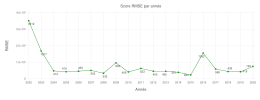

In [42]:
range_annee=sort(unique(dataset6.Année))[begin+3:end]

df = normalize_dataset(copy(dataset6))
y_normalisations = normalize_output(df)

range=sort(unique(df.Année))[begin+3:end]
cols=["Année"]
[push!(cols, "$(zone)") for zone in unique(df.Zone)]
resultats = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
resultats.Année .= range
vraies_valeurs = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
vraies_valeurs.Année .= range

rmse_par_année = []
i=1
for année_à_prédire in range
    train = df[df.Année .< année_à_prédire,  :]
    test  = df[df.Année .== année_à_prédire, :]

    y_train = train.Cerfs

    y_test = test.Cerfs;
    trained_models = train_models_by_zone(train, 0., 0.7)
    ŷ      = predict_by_zone(test, trained_models)
    ŷ      = retrieve_output(ŷ, test.Zone, y_normalisations)
    y_test = retrieve_output(y_test, test.Zone, y_normalisations)
    i=1
    for zone in test.Zone
        resultats[resultats.Année .== année_à_prédire, "$(zone)"] .= ŷ[i]
        vraies_valeurs[resultats.Année .== année_à_prédire, "$(zone)"] .= y_test[i]
        i+=1
    end
    
    push!(rmse_par_année, rms(y_test, ŷ))
end

vraies_valeurs.Année .= range_annee
resultats.Année .= range_annee

println("RMSE moyen : $(mean(rmse_par_année))")
println("RMSE médian : $(median(rmse_par_année))")

set_default_plot_size(26cm, 10cm)
plot(x=range_annee[begin:end-1], y=rmse_par_année[begin:end-1], Geom.line, Geom.point, color=[colorant"green"],
    label=["$(Int64(ceil(rmse)))" for rmse in rmse_par_année[begin:end-1]],
    Geom.label,
    Guide.xlabel("Année"),
    Guide.xticks(ticks=range_annee[begin:end-1]),
    Guide.ylabel("RMSE"),
    Guide.title("Score RMSE par année"))

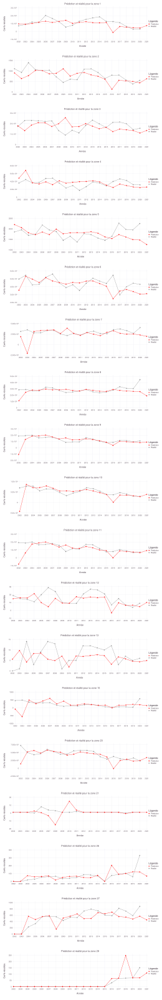

In [43]:
figs = []
for zone in unique(df.Zone)
    push!(figs,
        plot(x=range_annee, y=resultats[!, "$(zone)"], color=[colorant"red"], Geom.line, Geom.point,
            layer(x=range_annee[begin:end-1], y=vraies_valeurs[vraies_valeurs.Année .< range_annee[end], "$(zone)"], Geom.point, Geom.line, color=[colorant"grey"]),
            Guide.xlabel("Année"),
            Guide.ylabel("Cerfs récoltés"),
            Guide.title("Prédiction et réalité pour la zone $(zone)"),
            Guide.manual_color_key("Légende", ["Prédiction", "Réalité"], ["red", "grey"]),
            Guide.xticks(ticks=range_annee)
        )
    )
end
set_default_plot_size(26cm, 160cm)
vstack(figs...)

### 4.2 Test d'un modèle ne prenant en compte aucune information sur les années

Étant donné qu'on remarque souvent un effet d'un décalage d'une année lorsqu'il y a une variation soudaine puisqu'on s'appuie énormément sur la récolte de l'année précédente, on va essayer de faire un modèle ne prenant jamais en compte des données des années précédentes (principalement un but comparatif).

In [44]:
dataset2 = leftjoin(vcat(recolte_cp, a_predire), meteo_par_année, on = :Année)
dataset2 = leftjoin(dataset2, essence_par_année, on = :Année)
dataset2 = leftjoin(dataset2, permis_cp, on = :Année);
dataset2 = dataset2[dataset2.Année .== 2021 .|| .!ismissing.(:Cerfs), :]
dataset2 = Impute.interp(dataset2) |> Impute.locf() |> Impute.nocb();
dataset7 = copy(dataset2)
select!(dataset7, Not(["Engin_$(engin)" for engin in unique(recolte.Engin)])); # on ne veut pas garder les variables qui donnent directement le nombre de cerfs tués

In [45]:
range_annee=sort(unique(dataset7.Année))[begin+3:end]

df = normalize_dataset(copy(dataset7))

range=sort(unique(df.Année))[begin+3:end]
cols=["Année"]
[push!(cols, "$(zone)") for zone in unique(df.Zone)]
resultats = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
resultats.Année .= range
vraies_valeurs = DataFrame(ones(length(range), length(unique(df.Zone))+1), cols)
vraies_valeurs.Année .= range



rmse_par_année = []
for année_à_prédire in range
    train = df[df.Année .< année_à_prédire,  :]
    test  = df[df.Année .== année_à_prédire, :]
    
    x_train = select(train, Not([:Cerfs, :Zone]))
    y_train = train.Cerfs

    x_test = select(test, Not([:Cerfs, :Zone]))
    y_test = test.Cerfs;
    models = train_models_by_zone(train, 1.)
    ŷ      = predict_by_zone(test, models)
    i=1
    for zone in test.Zone
        resultats[resultats.Année .== année_à_prédire, "$(zone)"] .= ŷ[i]
        vraies_valeurs[resultats.Année .== année_à_prédire, "$(zone)"] .= y_test[i]
        i+=1
    end
    
    push!(rmse_par_année, rms(y_test, ŷ))
end

vraies_valeurs.Année .= range_annee
resultats.Année .= range_annee

set_default_plot_size(26cm, 10cm)
plot(x=range_annee[begin:end-1], y=rmse_par_année[begin:end-1], Geom.line, Geom.point, color=[colorant"green"],
    label=["$(Int64(ceil(rmse)))" for rmse in rmse_par_année[begin:end-1]],
    Geom.label,
    Guide.xlabel("Année"),
    Guide.xticks(ticks=range_annee[begin:end-1]),
    Guide.ylabel("RMSE"),
    Guide.title("Score RMSE par année"))

LoadError: MethodError: no method matching train_models_by_zone(::DataFrame, ::Float64)
[0mClosest candidates are:
[0m  train_models_by_zone(::DataFrame, ::Float64, [91m::Float64[39m) at In[41]:1

On remarque que le RMSE est clairement plus élevé sur ce graphique avec les prédictions faites sans prendre en compte les récoltes des dernières années que sur ce même graphique dans la section précédente où on avait pris en compte les récoltes des années passées. Cela laisse présager que ce modèle sera bien moins bon.

Nous rappelons que cette analyse sans les récoltes précédentes avait pour but de déterminer si on pouvait se fier aux récoltes de 2019 et 2020 pour prédire celles de 2021 (donc pour savoir si 2021 connait une variation soudaine). Pour cela, on a regardé le RMSE sur Kaggle qui était avec cette méthode bien moins bon (1569). On peut donc supposer que 2021 est dans la lignée des années précédentes et qu'il est utile de se fier aux récoltes des années passées.

---
## 5. Estimation du nombre de cerfs mâles adultes récoltés par zone de chasse en 2021 

On utilise le modèle simple de la section précédente pour estimer le nombre de cerfs récoltés pour chacune des lignes de l'ensemble de test.

#### 5.1 Chargement des données de l'ensemble de test et définition des variables explicatives

In [46]:
test = CSV.read("data/test.csv", DataFrame);

#### 5.2 Préparation du fichier des préditions pour téléverser sur Kaggle

Le fichier *benchmark_predictions.csv* généré peut être téléversé sur Kaggle. Il est composé d'une colonne de zones (Zone) et d'une colonne du nombre de cerfs récoltés (Cerfs).

In [47]:
ŷ=[]
[push!(ŷ, resultats[resultats.Année .== range_annee[end], "$(zone)"][1]) for zone in test.Zone]
prediction = DataFrame(Zone = test.Zone, Cerfs = ŷ)

CSV.write("output.csv", prediction)
prediction

LoadError: BoundsError: attempt to access 0-element Vector{Float64} at index [1]